In [ ]:
# Importando las bibliotecas necesarias
import pandas as pd

In [ ]:
from google.colab import files
files.upload()

Saving test.csv to test.csv
Saving sample_submission.csv to sample_submission.csv
Saving train.csv to train.csv


{'test.csv': b'id,date,country,store,product\n136950,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Improve Your Coding\n136951,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Train More LLMs\n136952,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win Friends and Influence People\n136953,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Win More Kaggle Competitions\n136954,2022-01-01,Argentina,Kaggle Learn,Using LLMs to Write Better\n136955,2022-01-01,Argentina,Kaggle Store,Using LLMs to Improve Your Coding\n136956,2022-01-01,Argentina,Kaggle Store,Using LLMs to Train More LLMs\n136957,2022-01-01,Argentina,Kaggle Store,Using LLMs to Win Friends and Influence People\n136958,2022-01-01,Argentina,Kaggle Store,Using LLMs to Win More Kaggle Competitions\n136959,2022-01-01,Argentina,Kaggle Store,Using LLMs to Write Better\n136960,2022-01-01,Argentina,Kagglazon,Using LLMs to Improve Your Coding\n136961,2022-01-01,Argentina,Kagglazon,Using LLMs to Train More LLMs\n136962,2022-01-01,Argentina,Ka

In [ ]:
# Cargando los datos
train_data = pd.read_csv('/content/train.csv')

In [ ]:
# Resumen estadístico de las variables numéricas
print("Resumen estadístico de las variables numéricas:")
print(train_data.describe())

Resumen estadístico de las variables numéricas:
                 id       num_sold
count  136950.00000  136950.000000
mean    68474.50000     165.522636
std     39534.20402     183.691575
min         0.00000       2.000000
25%     34237.25000      46.000000
50%     68474.50000      98.000000
75%    102711.75000     184.000000
max    136949.00000    1380.000000


In [ ]:
# Conteo de valores únicos para variables categóricas
print("\nConteo de valores únicos para variables categóricas:")
print("Países únicos:", train_data['country'].nunique())
print("Tiendas únicas:", train_data['store'].nunique())
print("Productos únicos:", train_data['product'].nunique())


Conteo de valores únicos para variables categóricas:
Países únicos: 5
Tiendas únicas: 3
Productos únicos: 5


In [ ]:
# Verificación de valores faltantes
print("\nVerificación de valores faltantes:")
print(train_data.isnull().sum())


Verificación de valores faltantes:
id          0
date        0
country     0
store       0
product     0
num_sold    0
dtype: int64


In [ ]:
# Importando bibliotecas adicionales para la visualización
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
# Configurando el estilo de los gráficos
sns.set_style("whitegrid")

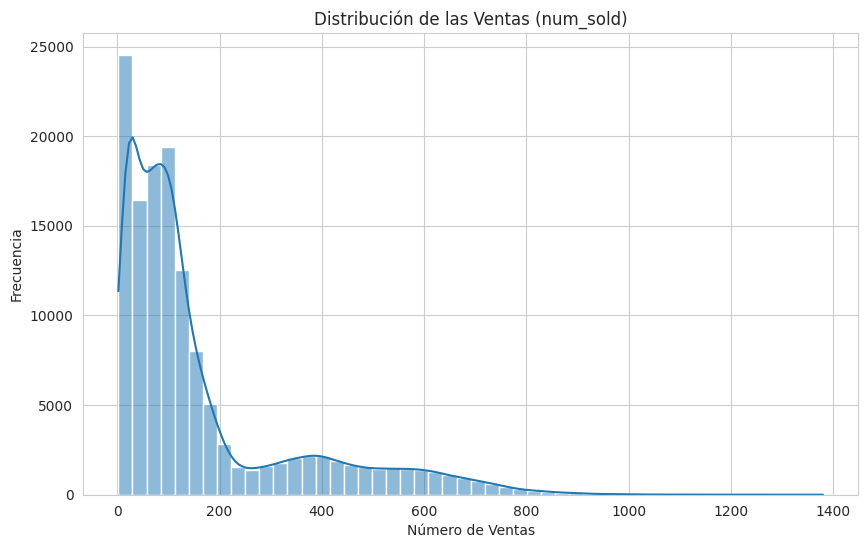

In [ ]:
# Visualización de la distribución de las ventas (num_sold)
plt.figure(figsize=(10, 6))
sns.histplot(train_data['num_sold'], kde=True, bins=50)
plt.title('Distribución de las Ventas (num_sold)')
plt.xlabel('Número de Ventas')
plt.ylabel('Frecuencia')
plt.show()

In [ ]:
# Convertir la columna 'date' a formato de fecha
train_data['date'] = pd.to_datetime(train_data['date'])


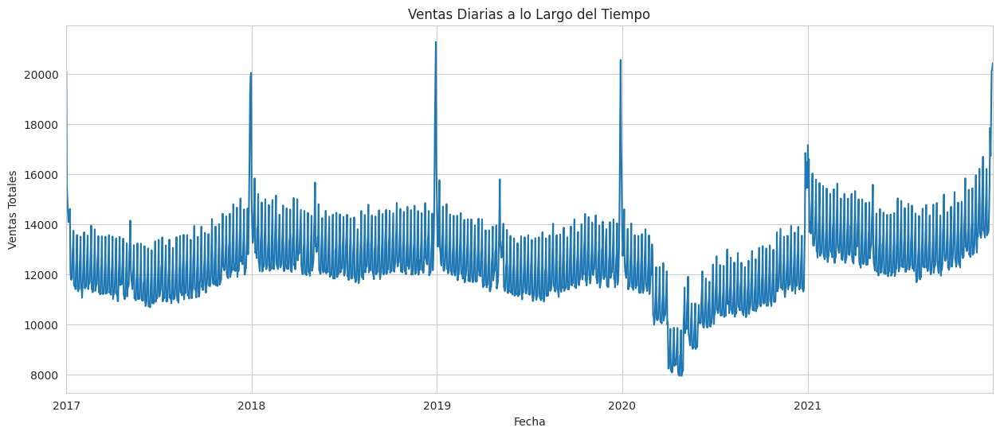

In [ ]:
# Gráfico de tendencias temporales para las ventas diarias
plt.figure(figsize=(15, 6))
train_data.groupby('date')['num_sold'].sum().plot()
plt.title('Ventas Diarias a lo Largo del Tiempo')
plt.xlabel('Fecha')
plt.ylabel('Ventas Totales')
plt.show()

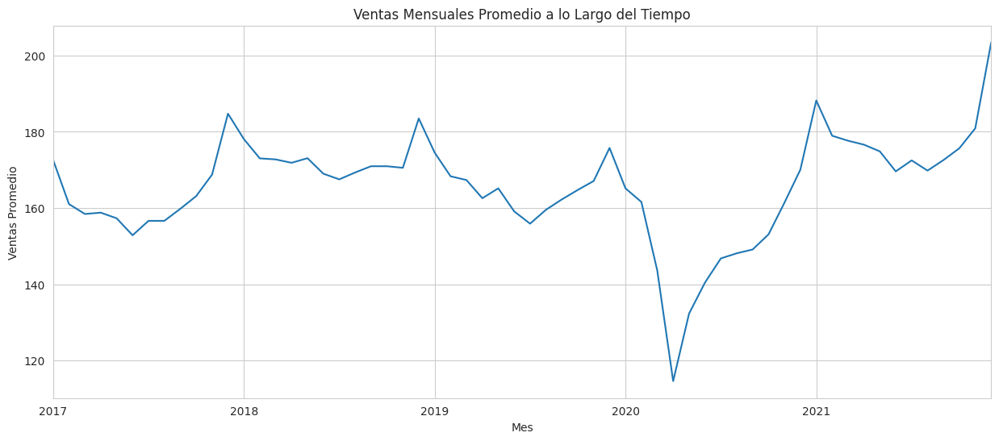

In [ ]:
# Gráfico de tendencias temporales para las ventas mensuales promedio
plt.figure(figsize=(15, 6))
train_data.groupby(train_data['date'].dt.to_period("M"))['num_sold'].mean().plot()
plt.title('Ventas Mensuales Promedio a lo Largo del Tiempo')
plt.xlabel('Mes')
plt.ylabel('Ventas Promedio')
plt.show()

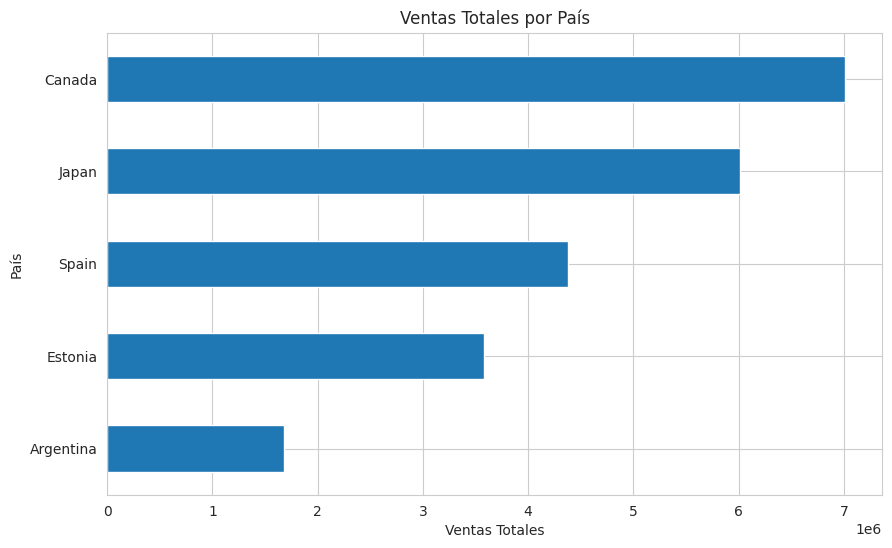

In [ ]:
# Distribución de ventas por país
plt.figure(figsize=(10, 6))
train_data.groupby('country')['num_sold'].sum().sort_values().plot(kind='barh')
plt.title('Ventas Totales por País')
plt.xlabel('Ventas Totales')
plt.ylabel('País')
plt.show()

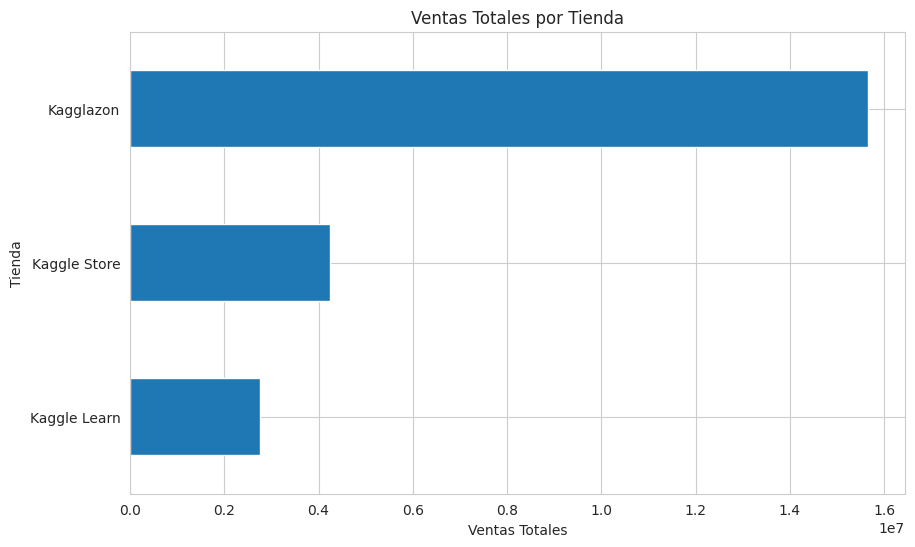

In [ ]:
# Distribución de ventas por tienda
plt.figure(figsize=(10, 6))
train_data.groupby('store')['num_sold'].sum().sort_values().plot(kind='barh')
plt.title('Ventas Totales por Tienda')
plt.xlabel('Ventas Totales')
plt.ylabel('Tienda')
plt.show()

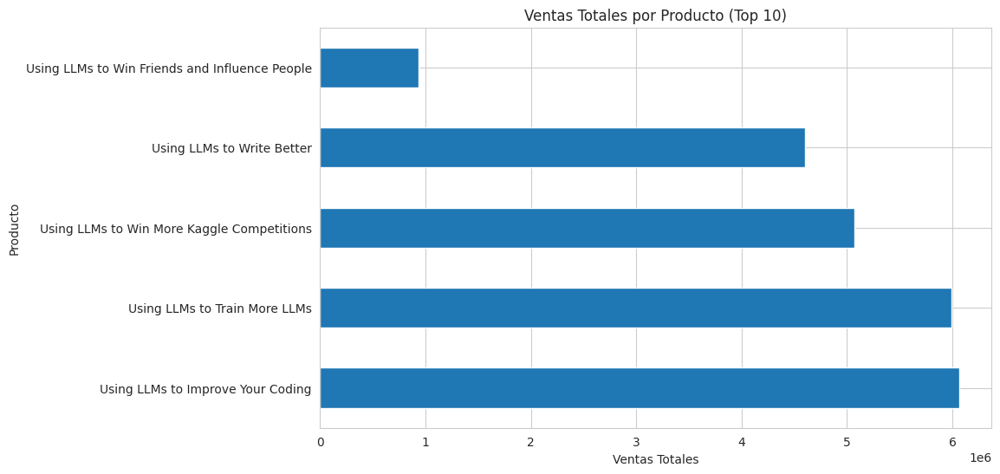

In [ ]:
# Distribución de ventas por producto (Top 10 productos más vendidos)
plt.figure(figsize=(10, 6))
train_data.groupby('product')['num_sold'].sum().sort_values(ascending=False).head(10).plot(kind='barh')
plt.title('Ventas Totales por Producto (Top 10)')
plt.xlabel('Ventas Totales')
plt.ylabel('Producto')
plt.show()

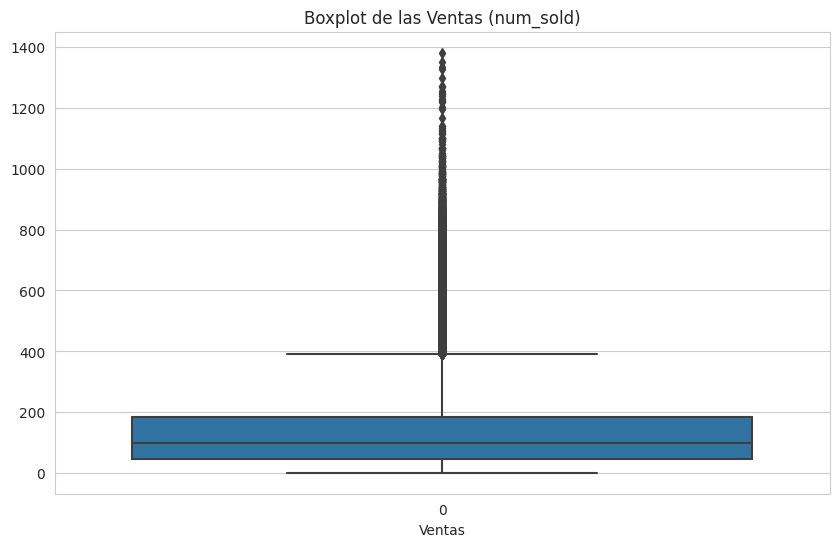

In [ ]:
# Boxplot de las ventas (num_sold)
plt.figure(figsize=(10, 6))
sns.boxplot(train_data['num_sold'])
plt.title('Boxplot de las Ventas (num_sold)')
plt.xlabel('Ventas')
plt.show()

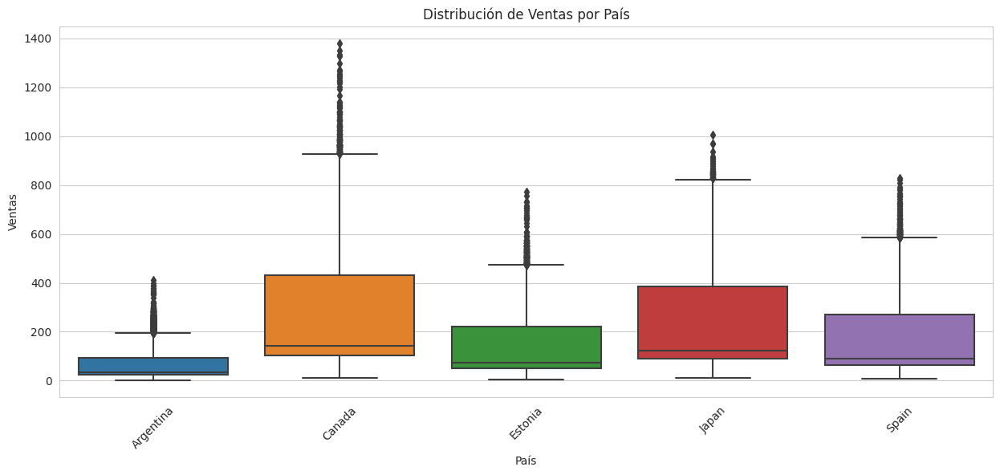

In [ ]:
# Boxplots de las ventas por país
plt.figure(figsize=(15, 6))
sns.boxplot(data=train_data, x='country', y='num_sold')
plt.title('Distribución de Ventas por País')
plt.xlabel('País')
plt.ylabel('Ventas')
plt.xticks(rotation=45)
plt.show()

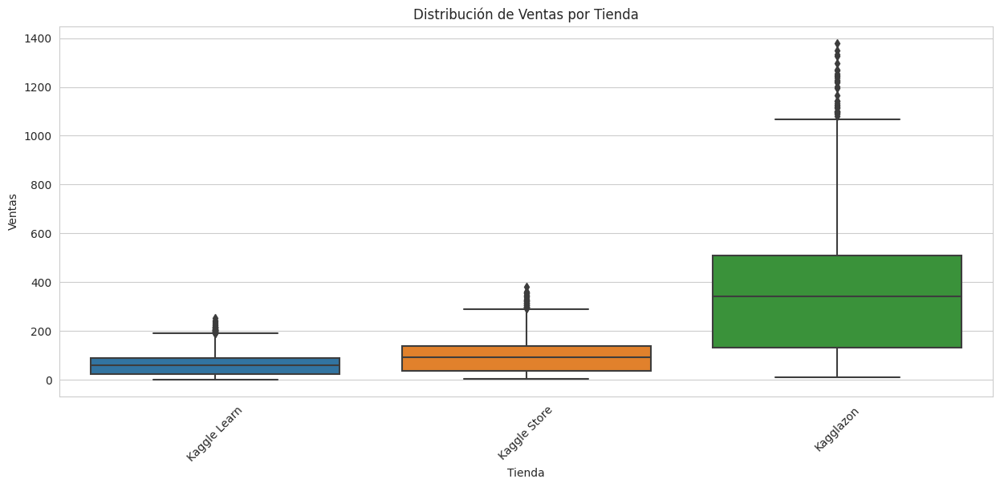

In [ ]:
# Boxplots de las ventas por tienda
plt.figure(figsize=(15, 6))
sns.boxplot(data=train_data, x='store', y='num_sold')
plt.title('Distribución de Ventas por Tienda')
plt.xlabel('Tienda')
plt.ylabel('Ventas')
plt.xticks(rotation=45)
plt.show()

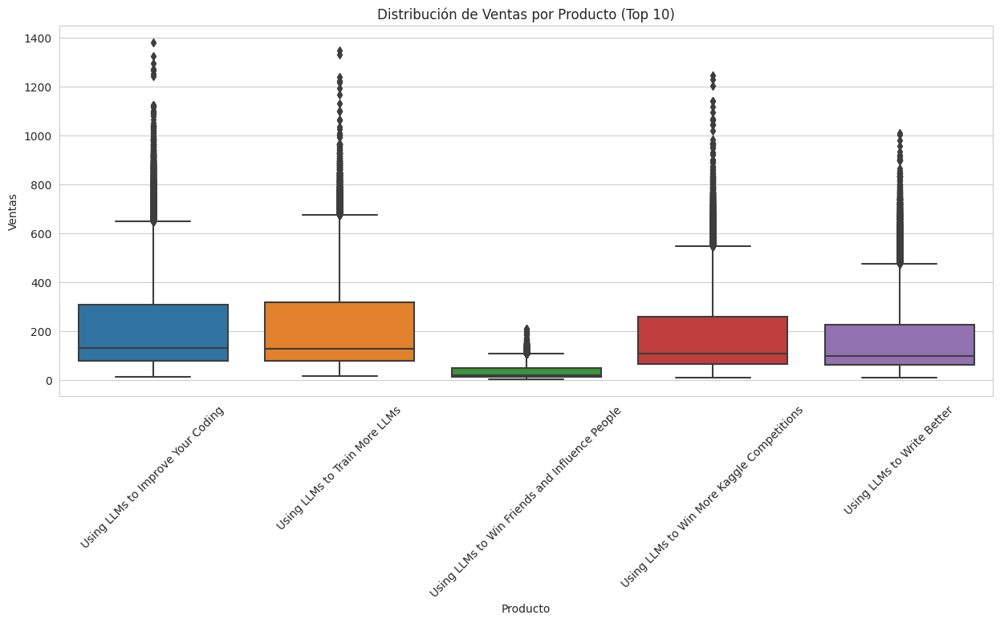

In [ ]:
# Boxplots de las ventas por producto (Top 10 productos más vendidos)
top_products = train_data.groupby('product')['num_sold'].sum().sort_values(ascending=False).head(10).index
plt.figure(figsize=(15, 6))
sns.boxplot(data=train_data[train_data['product'].isin(top_products)], x='product', y='num_sold')
plt.title('Distribución de Ventas por Producto (Top 10)')
plt.xlabel('Producto')
plt.ylabel('Ventas')
plt.xticks(rotation=45)
plt.show()

In [ ]:
# Importando bibliotecas adicionales
from statsmodels.tsa.seasonal import seasonal_decompose
from statsmodels.graphics.tsaplots import plot_acf

In [ ]:
# Creando una serie temporal de ventas diarias totales
ts = train_data.groupby('date')['num_sold'].sum()

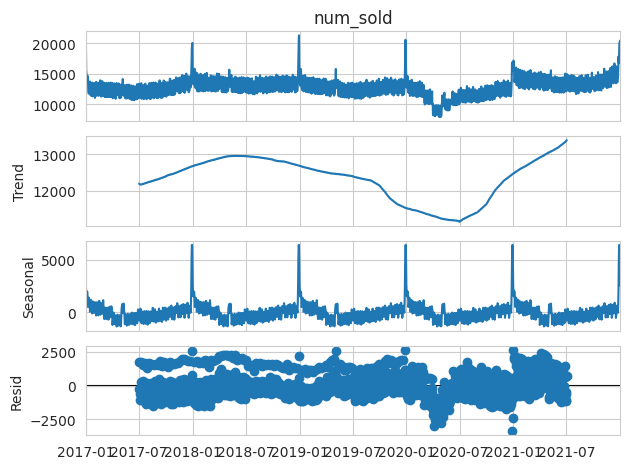

In [ ]:
# Descomposición de la serie temporal
result = seasonal_decompose(ts, model='additive', period=365)  # Usando un período de 365 para anualidad
result.plot()
plt.show()

<Figure size 1500x600 with 0 Axes>

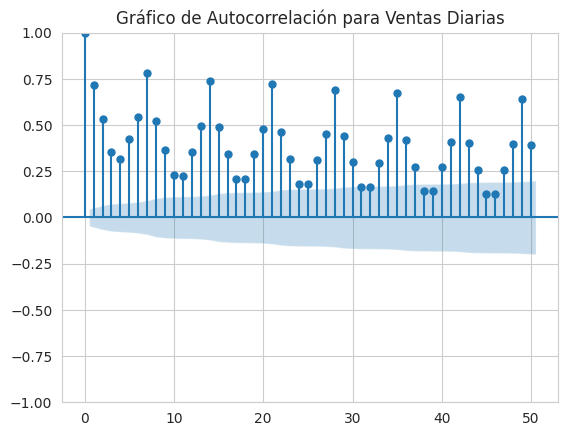

In [ ]:
# Análisis de autocorrelación
plt.figure(figsize=(15, 6))
plot_acf(ts, lags=50)  # Mostrando autocorrelación para 50 lags
plt.title('Gráfico de Autocorrelación para Ventas Diarias')
plt.show()

In [ ]:
# Creando una tabla pivot para obtener las ventas diarias de cada producto
pivot_data = train_data.pivot_table(index='date', columns='product', values='num_sold', aggfunc='sum').fillna(0)

In [ ]:
# Calculando la matriz de correlación entre productos
correlation_matrix = pivot_data.corr()

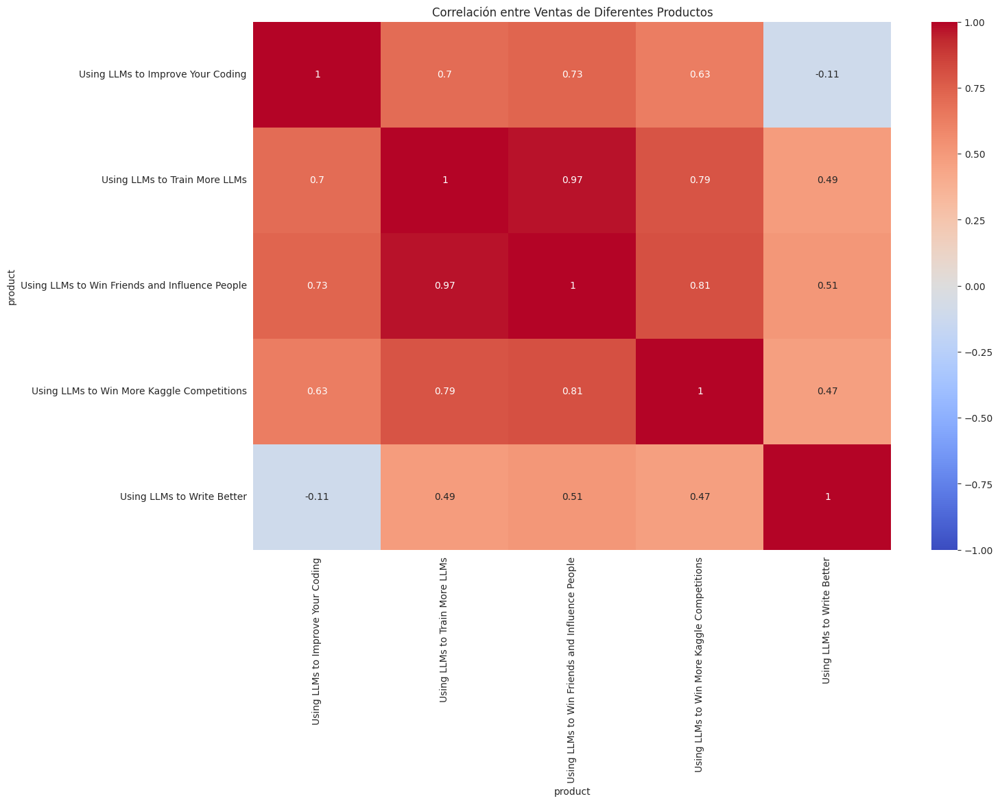

In [ ]:
# Visualizando la matriz de correlación con un heatmap
plt.figure(figsize=(15, 10))
sns.heatmap(correlation_matrix, annot=True, cmap='coolwarm', vmin=-1, vmax=1)
plt.title('Correlación entre Ventas de Diferentes Productos')
plt.show()

In [ ]:
# 1. Gestión de valores faltantes
# Verificando valores faltantes
missing_values = train_data.isnull().sum()
print("Valores faltantes por columna:\n", missing_values)

Valores faltantes por columna:
 id          0
date        0
country     0
store       0
product     0
num_sold    0
dtype: int64


In [ ]:
# 2. Codificación de variables categóricas
# Usaremos codificación one-hot para las variables categóricas 'country', 'store', y 'product'
train_data_encoded = pd.get_dummies(train_data, columns=['country', 'store', 'product'])

In [ ]:
# Extraer día de la semana, mes y año
train_data_encoded['day_of_week'] = train_data_encoded['date'].dt.dayofweek
train_data_encoded['month'] = train_data_encoded['date'].dt.month
train_data_encoded['year'] = train_data_encoded['date'].dt.year

In [ ]:
# Mostrar las primeras filas del conjunto de datos preprocesado
print(train_data_encoded.head())

   id       date  num_sold  country_Argentina  country_Canada  \
0   0 2017-01-01        63                  1               0   
1   1 2017-01-01        66                  1               0   
2   2 2017-01-01         9                  1               0   
3   3 2017-01-01        59                  1               0   
4   4 2017-01-01        49                  1               0   

   country_Estonia  country_Japan  country_Spain  store_Kagglazon  \
0                0              0              0                0   
1                0              0              0                0   
2                0              0              0                0   
3                0              0              0                0   
4                0              0              0                0   

   store_Kaggle Learn  store_Kaggle Store  \
0                   1                   0   
1                   1                   0   
2                   1                   0   
3             

In [ ]:
# Importando las bibliotecas necesarias
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor
import xgboost as xgb
from sklearn.metrics import mean_squared_error

In [ ]:
# 1. Dividir el conjunto de datos
# Eliminando la columna 'date' ya que hemos extraído características relevantes de ella
X = train_data_encoded.drop(columns=['date', 'num_sold'])
y = train_data_encoded['num_sold']

X_train, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=42)

In [ ]:
# 2. Modelo de Regresión Lineal
lr_model = LinearRegression()
lr_model.fit(X_train, y_train)
lr_preds = lr_model.predict(X_val)
lr_rmse = mean_squared_error(y_val, lr_preds, squared=False)
print(f"RMSE del Modelo de Regresión Lineal: {lr_rmse}")

RMSE del Modelo de Regresión Lineal: 91.41398883626691


In [ ]:
# 3. Modelo de Bosque Aleatorio
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)
rf_preds = rf_model.predict(X_val)
rf_rmse = mean_squared_error(y_val, rf_preds, squared=False)
print(f"RMSE del Modelo de Bosque Aleatorio: {rf_rmse}")

RMSE del Modelo de Bosque Aleatorio: 17.52466604427857


In [ ]:
# 4. Modelo XGBoost
xgb_model = xgb.XGBRegressor(n_estimators=100, learning_rate=0.1, random_state=42)
xgb_model.fit(X_train, y_train)
xgb_preds = xgb_model.predict(X_val)
xgb_rmse = mean_squared_error(y_val, xgb_preds, squared=False)
print(f"RMSE del Modelo XGBoost: {xgb_rmse}")

RMSE del Modelo XGBoost: 18.76471063352268


In [ ]:
import numpy as np


In [ ]:
# Definición de la función SMAPE
def smape(y_true, y_pred):
    return 100 * np.mean(2 * np.abs(y_pred - y_true) / (np.abs(y_pred) + np.abs(y_true)))

# Evaluación de los modelos usando SMAPE
lr_smape = smape(y_val, lr_preds)
rf_smape = smape(y_val, rf_preds)
xgb_smape = smape(y_val, xgb_preds)

print(f"SMAPE del Modelo de Regresión Lineal: {lr_smape:.2f}%")
print(f"SMAPE del Modelo de Bosque Aleatorio: {rf_smape:.2f}%")
print(f"SMAPE del Modelo XGBoost: {xgb_smape:.2f}%")

SMAPE del Modelo de Regresión Lineal: 60.35%
SMAPE del Modelo de Bosque Aleatorio: 5.40%
SMAPE del Modelo XGBoost: 8.53%


In [ ]:
from sklearn.model_selection import GridSearchCV

# Definición de los hiperparámetros a ajustar
param_grid_rf = {
    'n_estimators': [50, 100, 200],
    'max_depth': [None, 10, 20, 30],
    'min_samples_split': [2, 5, 10],
    'min_samples_leaf': [1, 2, 4]
}

grid_search_rf = GridSearchCV(RandomForestRegressor(random_state=42), param_grid_rf, cv=3, scoring='neg_mean_squared_error', verbose=2, n_jobs=-1)
grid_search_rf.fit(X_train, y_train)

print("Mejores hiperparámetros para Bosque Aleatorio:", grid_search_rf.best_params_)

Fitting 3 folds for each of 108 candidates, totalling 324 fits


/usr/local/lib/python3.10/dist-packages/joblib/externals/loky/process_executor.py:752: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  warnings.warn(


Mejores hiperparámetros para Bosque Aleatorio: {'max_depth': 20, 'min_samples_leaf': 1, 'min_samples_split': 5, 'n_estimators': 200}


In [ ]:
# Entrenar el Bosque Aleatorio con los mejores hiperparámetros
rf_adjusted = RandomForestRegressor(max_depth=20, min_samples_leaf=1, min_samples_split=5, n_estimators=200, random_state=42)
rf_adjusted.fit(X_train, y_train)

RandomForestRegressor(max_depth=20, min_samples_split=5, n_estimators=200,
                      random_state=42)

In [ ]:
# Predecir con el modelo ajustado
rf_preds_adjusted = rf_adjusted.predict(X_val)

In [ ]:
# Calcular SMAPE para el modelo ajustado
rf_smape_adjusted = smape(y_val, rf_preds_adjusted)

In [ ]:
# Comparar SMAPE del modelo original y el modelo ajustado
print(f"SMAPE original del Modelo de Bosque Aleatorio: {rf_smape:.2f}%")
print(f"SMAPE ajustado del Modelo de Bosque Aleatorio: {rf_smape_adjusted:.2f}%")

SMAPE original del Modelo de Bosque Aleatorio: 5.40%
SMAPE ajustado del Modelo de Bosque Aleatorio: 5.29%


In [1]:
# Preparar los datos de prueba (asegurarse de que tenga las mismas características que los datos de entrenamiento)
X_test = test_data_encoded.drop(columns=['date'])

NameError: ignored